project title : Customer Segmentation and Targeted Marketing Analysis
**BY JUNAID KHAN**

goal : Overall, the "Customer Segmentation and Targeted Marketing Analysis" project aims to leverage data-driven insights to optimize marketing strategies, improve customer relationships, and drive business growth by focusing on the specific needs and preferences of distinct customer segments.

dataset : https://archive.ics.uci.edu/dataset/352/online+retail

Note*(compulsory) = download dataset using above link, then convert into csv format then change the name of the dataset is "Online Retail dataset by junaid.csv"
then use it .

In [6]:
from google.colab import files # its take some second please wait


uploaded = files.upload()


Saving Online Retail dataset by junaid.csv to Online Retail dataset by junaid.csv


In [7]:
import pandas as pd

# Load the dataset
data = pd.read_csv("Online Retail dataset by junaid.csv")
data.head(10)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,01-12-2010 08:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,01-12-2010 08:26,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,01-12-2010 08:28,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,01-12-2010 08:28,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,01-12-2010 08:34,1.69,13047.0,United Kingdom


**Explore and understand the dataset**

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [9]:
# Check the number of rows and columns:
print(f"Number of rows: {data.shape[0]}")
print(f"Number of columns: {data.shape[1]}")

Number of rows: 541909
Number of columns: 8


In [10]:
# Display the column names:
print(data.columns)

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')


In [11]:
# Check missing values:
print(data.isnull().sum())

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


**Data cleaning and preprocessing**

In [12]:
# Handle missing values
data = data.dropna(subset=['Description'])
print(data.isnull().sum())

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133626
Country             0
dtype: int64


In [13]:
# after delete description (null values) Check the number of rows and columns:
print(f"Number of rows: {data.shape[0]}")
print(f"Number of columns: {data.shape[1]}")

Number of rows: 540455
Number of columns: 8


In [14]:
# Remove duplicates
data = data.drop_duplicates()

In [15]:
# after drop (all duplicates values) Check the number of rows and columns:
print(f"Number of rows: {data.shape[0]}")
print(f"Number of columns: {data.shape[1]}")

Number of rows: 535187
Number of columns: 8


In [16]:
# Convert data types (convert string dates to datetime)
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

In [17]:
# Create new features (total order value, average order value)
data['TotalOrderValue'] = data['Quantity'] * data['UnitPrice']
data['AverageOrderValue'] = data.groupby('InvoiceNo')['TotalOrderValue'].transform('sum')
print(data['TotalOrderValue'],data['AverageOrderValue'] )

0         15.30
1         20.34
2         22.00
3         20.34
4         20.34
          ...  
541904    10.20
541905    12.60
541906    16.60
541907    16.60
541908    14.85
Name: TotalOrderValue, Length: 535187, dtype: float64 0         139.12
1         139.12
2         139.12
3         139.12
4         139.12
           ...  
541904    249.45
541905    249.45
541906    249.45
541907    249.45
541908    249.45
Name: AverageOrderValue, Length: 535187, dtype: float64


**Exploratory Data Analysis (EDA)**

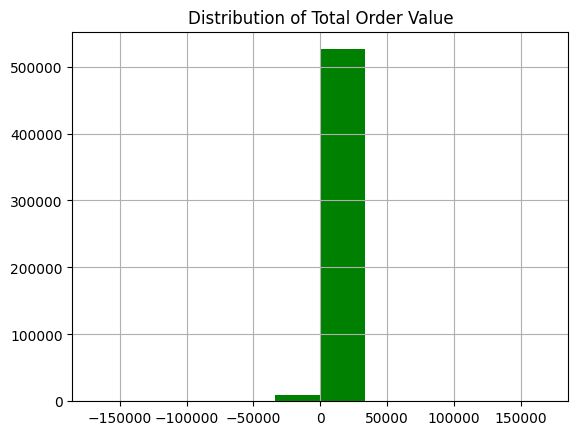

In [18]:
# Visualize numerical features (histogram of total order value)
import matplotlib.pyplot as plt

data['TotalOrderValue'].hist(bins=10, color='green')
plt.title('Distribution of Total Order Value')
plt.show()

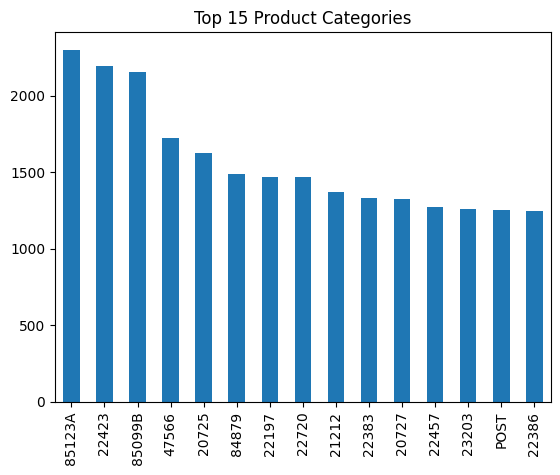

In [19]:
# Analyze categorical features (bar plot of product categories)
product_categories = data['StockCode'].value_counts().head(15)
product_categories.plot(kind='bar')
plt.title('Top 15 Product Categories')
plt.show()

**Feature selection and engineering**

In [20]:
# Select relevant features for customer segmentation
features = ['TotalOrderValue', 'AverageOrderValue', 'Quantity']

In [21]:
# Engineer new features like RFM scores
from datetime import datetime

today = datetime.today()
data['Recency'] = (today - data['InvoiceDate']).dt.days
data['Frequency'] = data.groupby('CustomerID')['InvoiceNo'].transform('count')
data['Monetary'] = data.groupby('CustomerID')['TotalOrderValue'].transform('sum')

In [22]:
print(data['Recency'],data['Frequency'],data['Monetary'])

0         5183
1         5183
2         5183
3         5183
4         5183
          ... 
541904    4575
541905    4575
541906    4575
541907    4575
541908    4575
Name: Recency, Length: 535187, dtype: int64 0         309.0
1         309.0
2         309.0
3         309.0
4         309.0
          ...  
541904     52.0
541905     52.0
541906     52.0
541907     52.0
541908     52.0
Name: Frequency, Length: 535187, dtype: float64 0         5303.48
1         5303.48
2         5303.48
3         5303.48
4         5303.48
           ...   
541904     862.81
541905     862.81
541906     862.81
541907     862.81
541908     862.81
Name: Monetary, Length: 535187, dtype: float64


**Customer segmentation**

In [23]:
# Import required libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [24]:
# Scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data[features])

In [25]:
scaled_features

array([[-0.00753755, -0.5081776 , -0.01676076],
       [ 0.00568484, -0.5081776 , -0.01676076],
       [ 0.01003984, -0.5081776 , -0.0076308 ],
       ...,
       [-0.00412701, -0.46184857, -0.02589073],
       [-0.00412701, -0.46184857, -0.02589073],
       [-0.00871812, -0.46184857, -0.03045571]])

In [26]:
# Perform K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(scaled_features)
data['Cluster'] = clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Segment profiling and interpretation**

In [27]:
# Analyze segment characteristics
segment_profiles = data.groupby('Cluster')[features].mean()
print(segment_profiles)

         TotalOrderValue  AverageOrderValue      Quantity
Cluster                                                  
0              15.166098         692.412511      8.805026
1         -122826.600000     -122826.600000 -77605.000000
2             204.144171       19109.115128     74.355927
3          122826.600000      122826.600000  77605.000000
4              31.002618        5467.668075     12.730963


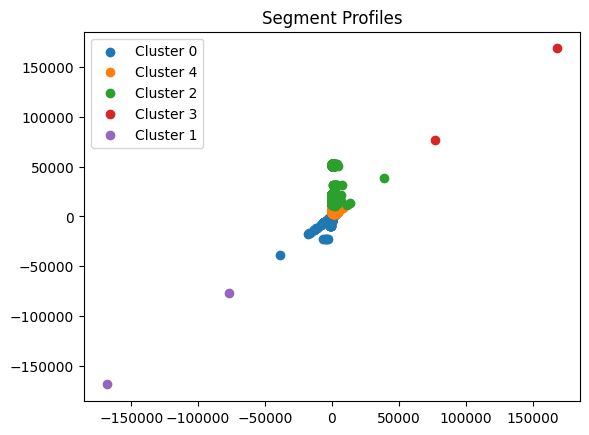

In [28]:
# Visualize segment profiles (scatter plot of total order value vs. average order value)
for cluster in data['Cluster'].unique():
  plt.scatter(data[data['Cluster'] == cluster]['TotalOrderValue'],
              data[data['Cluster'] == cluster]['AverageOrderValue'],
              label=f'Cluster {cluster}')
plt.legend()
plt.title('Segment Profiles')
plt.show()

**insightful charts** : (this section takes some time so please wait some seconds)

**1. Customer Segmentation Map: 3D Scatter Plot**

In [29]:
# need a column "Purchase Frequency" to represents the purchase frequency or the number of orders per customer

# Group the data by 'CustomerID' and count the unique 'InvoiceNo' values
purchasefrequency = data.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()

# Rename the column with the counted values to 'purchaseFrequency'
purchasefrequency.columns = ['CustomerID', 'purchaseFrequency']

# Merge the 'Frequency' column back into the original dataset
data = pd.merge(data, purchasefrequency, on='CustomerID', how='left')

In [30]:
print(f"Number of columns: {data.shape[1]}")

Number of columns: 15


In [31]:
data.head(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalOrderValue,AverageOrderValue,Recency,Frequency,Monetary,Cluster,purchaseFrequency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-01-12 08:26:00,2.55,17850.0,United Kingdom,15.30,139.12,5183,309.0,5303.48,0,35.0
1,536365,71053,WHITE METAL LANTERN,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,20.34,139.12,5183,309.0,5303.48,0,35.0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-01-12 08:26:00,2.75,17850.0,United Kingdom,22.00,139.12,5183,309.0,5303.48,0,35.0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,20.34,139.12,5183,309.0,5303.48,0,35.0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,20.34,139.12,5183,309.0,5303.48,0,35.0


NOTE*:below code take more time bcz of 3d plot so please wait some moment

In [37]:
import plotly.express as px

fig = px.scatter_3d(data, x='TotalOrderValue', y='AverageOrderValue', z='Frequency',
                    color='Cluster', opacity=0.7, color_continuous_scale='Viridis')

fig.update_layout(title='1. Customer Segmentation Map: 3D Scatter Plot',
                  scene=dict(
                      xaxis_title='Total Order Value',
                      yaxis_title='Average Order Value',
                      zaxis_title='number of orders per customer'), # or Purchase Frequency
                  width=800, height=600)

fig.show()

**2. Customer Lifetime Value Funnel: Funnel Chart**

In [35]:
# Calculate Customer Lifetime Value (CLV)
data['CustomerLifetimeValue'] = data.groupby('CustomerID')['TotalOrderValue'].transform('sum')
data['CustomerLifetimeValue']

0         5303.48
1         5303.48
2         5303.48
3         5303.48
4         5303.48
           ...   
535182     862.81
535183     862.81
535184     862.81
535185     862.81
535186     862.81
Name: CustomerLifetimeValue, Length: 535187, dtype: float64

In [36]:
# Create CLV Tiers
import pandas as pd

# Create CLV tiers based on quantiles
bins = [0, data['CustomerLifetimeValue'].quantile(0.2), data['CustomerLifetimeValue'].quantile(0.4),
        data['CustomerLifetimeValue'].quantile(0.6), data['CustomerLifetimeValue'].quantile(0.8),
        data['CustomerLifetimeValue'].quantile(1)]
labels = ['Low', 'Mid-Low', 'Mid', 'Mid-High', 'High']
data['CLVTier'] = pd.qcut(data['CustomerLifetimeValue'], q=5, labels=labels, duplicates='drop')
data['CLVTier']

0         Mid-High
1         Mid-High
2         Mid-High
3         Mid-High
4         Mid-High
            ...   
535182     Mid-Low
535183     Mid-Low
535184     Mid-Low
535185     Mid-Low
535186     Mid-Low
Name: CLVTier, Length: 535187, dtype: category
Categories (5, object): ['Low' < 'Mid-Low' < 'Mid' < 'Mid-High' < 'High']

In [38]:
import plotly.graph_objects as go

# Count the number of customers in each CLV tier
clv_tiers = data.groupby('CLVTier')['CustomerID'].nunique().reset_index()
clv_tiers.columns = ['CLVTier', 'NumCustomers']

fig = go.Figure(go.Funnel(
    y=clv_tiers['CLVTier'],
    x=clv_tiers['NumCustomers'],
    textinfo="value+percent initial"))

fig.update_layout(title='2. Customer Lifetime Value Funnel: Funnel Chart',
                  xaxis_title='Number of Customers',
                  yaxis_title='CLV Tier')

fig.show()

**3. Geographical Distribution of Segments: Choropleth Map**

In [42]:
import plotly.express as px

# Assuming you have location data like 'Country' and assigned 'Cluster' labels
country_segments = data.groupby(['Country', 'Cluster'])['CustomerID'].nunique().reset_index()

fig = px.choropleth(country_segments, locations='Country',
                    color='Cluster',
                    hover_name='Country',
                    color_continuous_scale='Plasma',
                    projection='natural earth')

fig.update_layout(title='3. Geographical Distribution of Segments: Choropleth Map',
                  geo=dict(scope='world', showframe=False, projection={'type': 'natural earth'}))

fig.show()